Loading captions...
Total samples: 40455
Unique images: 8091
Captions per image: 5.0

Sample captions:

Image: 1000268201_693b08cb0e.jpg
  - A child in a pink dress is climbing up a set of stairs in an entry way .
  - A girl going into a wooden building .
  - A little girl climbing into a wooden playhouse .
  - A little girl climbing the stairs to her playhouse .
  - A little girl in a pink dress going into a wooden cabin .

Vocabulary built:
  Total unique words: 8918
  Vocab size (freq >= 5): 3005
Using 3236 images (40%% of dataset) for fast training
Using 3236 images (40% of dataset) for fast training

Dataset split:
  Train images: 2750, captions: 13750
  Val images: 486, captions: 2430

DataLoaders created:
  Train batches: 430
  Val batches: 76

Displaying sample images with captions...


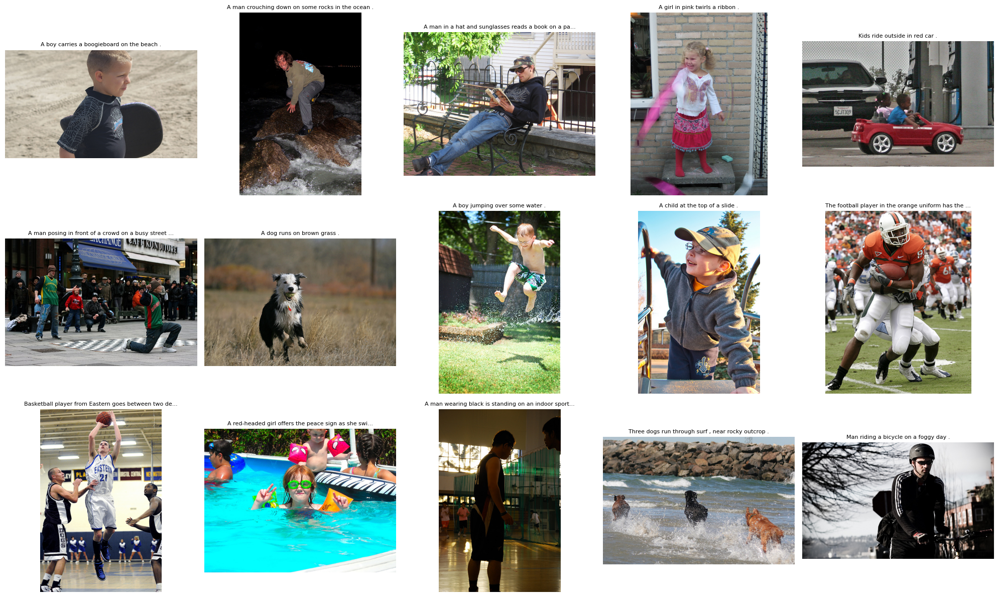

In [6]:
# Cell 1: Dataset loader - load images and captions, build vocabulary, create DataLoaders
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from pathlib import Path
from collections import Counter
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import random

# Configuration
DATA_DIR = Path('dataset')
IMAGES_DIR = DATA_DIR / 'Images'
CAPTIONS_FILE = DATA_DIR / 'captions.txt'
MODEL_DIR = Path('Model')
MODEL_DIR.mkdir(exist_ok=True)

BATCH_SIZE = 32
NUM_WORKERS = 0
RANDOM_STATE = 42
IMAGE_SIZE = 224
MIN_WORD_FREQ = 5
MAX_CAPTION_LEN = 20

# Set random seeds
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

# Load captions
print("Loading captions...")
data = pd.read_csv(CAPTIONS_FILE)
print(f"Total samples: {len(data)}")
print(f"Unique images: {data['image'].nunique()}")
print(f"Captions per image: {len(data) / data['image'].nunique():.1f}")

# Display sample data
print("\nSample captions:")
sample_img = data['image'].iloc[0]
print(f"\nImage: {sample_img}")
for idx, row in data[data['image'] == sample_img].iterrows():
    print(f"  - {row['caption']}")

# Build vocabulary
class Vocabulary:
    def __init__(self, min_freq=MIN_WORD_FREQ):
        self.min_freq = min_freq
        self.word2idx = {}
        self.idx2word = {}
        self.word_freq = Counter()
        
    def build_vocab(self, captions):
        # Count word frequencies
        for caption in captions:
            tokens = caption.lower().split()
            self.word_freq.update(tokens)
        
        # Add special tokens
        self.word2idx = {'<PAD>': 0, '<START>': 1, '<END>': 2, '<UNK>': 3}
        
        # Add words that meet frequency threshold
        idx = 4
        for word, freq in self.word_freq.items():
            if freq >= self.min_freq:
                self.word2idx[word] = idx
                idx += 1
        
        # Create reverse mapping
        self.idx2word = {idx: word for word, idx in self.word2idx.items()}
        
        print(f"\nVocabulary built:")
        print(f"  Total unique words: {len(self.word_freq)}")
        print(f"  Vocab size (freq >= {self.min_freq}): {len(self.word2idx)}")
        
    def encode(self, caption):
        tokens = caption.lower().split()
        return [self.word2idx.get(word, self.word2idx['<UNK>']) for word in tokens]
    
    def decode(self, indices):
        return ' '.join([self.idx2word.get(idx, '<UNK>') for idx in indices])
    
    def __len__(self):
        return len(self.word2idx)

# Build vocabulary
vocab = Vocabulary(min_freq=MIN_WORD_FREQ)
vocab.build_vocab(data['caption'].tolist())

# Create custom dataset
class ImageCaptionDataset(Dataset):
    def __init__(self, dataframe, vocab, images_dir, transform=None, max_len=MAX_CAPTION_LEN):
        self.data = dataframe.reset_index(drop=True)
        self.vocab = vocab
        self.images_dir = images_dir
        self.transform = transform
        self.max_len = max_len
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        # Load image
        img_name = self.data.iloc[idx]['image']
        img_path = os.path.join(self.images_dir, img_name)
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        # Process caption
        caption = self.data.iloc[idx]['caption']
        tokens = [self.vocab.word2idx['<START>']] + self.vocab.encode(caption) + [self.vocab.word2idx['<END>']]
        
        # Truncate if too long
        if len(tokens) > self.max_len:
            tokens = tokens[:self.max_len]
        
        return image, torch.tensor(tokens, dtype=torch.long), img_name

# Custom collate function for variable length sequences
def collate_fn(batch):
    # Sort batch by caption length (descending)
    batch.sort(key=lambda x: len(x[1]), reverse=True)
    
    images, captions, img_names = zip(*batch)
    images = torch.stack(images, 0)
    
    # Get lengths
    lengths = [len(cap) for cap in captions]
    
    # Pad captions
    max_len = max(lengths)
    padded_captions = torch.zeros(len(captions), max_len, dtype=torch.long)
    for i, cap in enumerate(captions):
        end = lengths[i]
        padded_captions[i, :end] = cap
    
    return images, padded_captions, lengths, img_names

# Image transforms
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Split dataset (85%% train, 15%% val) - Using 40%% of data for fast training
unique_images = data["image"].unique().tolist()
random.shuffle(unique_images)

# Use only 40%% of images for faster training (target: <200 min)
subset_size = int(0.4 * len(unique_images))
unique_images = unique_images[:subset_size]
print(f"Using {len(unique_images)} images (40%% of dataset) for fast training")


# Use only 40% of images for faster training (target: <200 min)
subset_size = int(1.0 * len(unique_images))
unique_images = unique_images[:subset_size]
print(f"Using {len(unique_images)} images (40% of dataset) for fast training")

split_idx = int(0.85 * len(unique_images))
train_images = unique_images[:split_idx]
val_images = unique_images[split_idx:]

train_data = data[data['image'].isin(train_images)]
val_data = data[data['image'].isin(val_images)]

print(f"\nDataset split:")
print(f"  Train images: {len(train_images)}, captions: {len(train_data)}")
print(f"  Val images: {len(val_images)}, captions: {len(val_data)}")

# Create datasets and loaders
train_dataset = ImageCaptionDataset(train_data, vocab, IMAGES_DIR, transform)
val_dataset = ImageCaptionDataset(val_data, vocab, IMAGES_DIR, transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, 
                          num_workers=NUM_WORKERS, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, 
                        num_workers=NUM_WORKERS, collate_fn=collate_fn)

print(f"\nDataLoaders created:")
print(f"  Train batches: {len(train_loader)}")
print(f"  Val batches: {len(val_loader)}")

# Display sample images with captions
def display_images(num_samples=15):
    """Display sample images with their captions"""
    plt.figure(figsize=(20, 12))
    
    # Get random samples
    sample_indices = random.sample(range(len(data)), num_samples)
    
    for i, idx in enumerate(sample_indices):
        img_name = data.iloc[idx]['image']
        caption = data.iloc[idx]['caption']
        
        # Load image
        img_path = os.path.join(IMAGES_DIR, img_name)
        img = Image.open(img_path).convert('RGB')
        
        plt.subplot(3, 5, i + 1)
        plt.imshow(img)
        plt.title(caption[:50] + '...' if len(caption) > 50 else caption, fontsize=8)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Display sample images
print("\nDisplaying sample images with captions...")
display_images(15)

In [7]:
# Cell 2: Model definition and training
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from datetime import datetime
import os

# Hyperparameters
EPOCHS = 50  # Reduced for fast training (target: <200 min)
LR = 1e-3
EMBED_SIZE = 256
HIDDEN_SIZE = 512
NUM_LAYERS = 1
DROPOUT = 0.5
TEACHER_FORCING_RATIO = 1.0

# Device setup
if torch.cuda.is_available():
    torch.cuda.empty_cache()
    device = torch.device('cuda')
    print(f'Using device: {device}')
    print(f'GPU: {torch.cuda.get_device_name(0)}')
else:
    device = torch.device('cpu')
    print('Using CPU')

# Encoder: CNN for image feature extraction
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        # Use pretrained DenseNet201
        densenet = models.densenet201(pretrained=True)
        
        # Freeze parameters (we only use it for feature extraction)
        for param in densenet.parameters():
            param.requires_grad = False
        
        # Remove the final classification layer
        modules = list(densenet.children())[:-1]
        self.densenet = nn.Sequential(*modules)
        
        # Adaptive pooling to get fixed size output
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 1))
        
        # Linear layer to project to embedding size
        # DenseNet201 has 1920 features
        self.fc = nn.Linear(1920, embed_size)
        self.bn = nn.BatchNorm1d(embed_size)
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, images):
        with torch.no_grad():
            features = self.densenet(images)  # [batch, 1920, 7, 7]
        
        features = self.adaptive_pool(features)  # [batch, 1920, 1, 1]
        features = features.view(features.size(0), -1)  # [batch, 1920]
        features = self.fc(features)  # [batch, embed_size]
        features = self.bn(features)
        features = self.dropout(features)
        return features

# Decoder: LSTM for caption generation
class DecoderLSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, dropout=0.5):
        super(DecoderLSTM, self).__init__()
        self.embed_size = embed_size
        self.hidden_size = hidden_size
        self.vocab_size = vocab_size
        self.num_layers = num_layers
        
        # Embedding layer for words
        self.embedding = nn.Embedding(vocab_size, embed_size)
        
        # LSTM
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, 
                           batch_first=True, dropout=dropout if num_layers > 1 else 0)
        
        # Dropout
        self.dropout = nn.Dropout(dropout)
        
        # Output layer
        self.fc = nn.Linear(hidden_size, vocab_size)
        
    def forward(self, features, captions, lengths):
        # features: [batch, embed_size]
        # captions: [batch, seq_len]
        
        # Embed captions
        embeddings = self.embedding(captions)  # [batch, seq_len, embed_size]
        
        # Concatenate image features with caption embeddings
        # features: [batch, embed_size] -> [batch, 1, embed_size]
        features = features.unsqueeze(1)
        embeddings = torch.cat([features, embeddings[:, :-1, :]], dim=1)  # [batch, seq_len, embed_size]
        
        # Pack padded sequences
        packed = nn.utils.rnn.pack_padded_sequence(embeddings, lengths, batch_first=True, enforce_sorted=True)
        
        # LSTM forward
        hiddens, _ = self.lstm(packed)
        
        # Unpack
        hiddens, _ = nn.utils.rnn.pad_packed_sequence(hiddens, batch_first=True)
        
        # Apply dropout and output layer
        outputs = self.fc(self.dropout(hiddens))  # [batch, seq_len, vocab_size]
        
        return outputs
    
    def generate(self, features, vocab, max_length=20):
        """Generate caption for given image features"""
        result = []
        
        # Start with <START> token
        inputs = torch.tensor([[vocab.word2idx['<START>']]], device=features.device)
        
        hidden = None
        
        for _ in range(max_length):
            # Embed input
            embeddings = self.embedding(inputs)  # [1, 1, embed_size]
            
            if hidden is None:
                # First step: concatenate image features
                embeddings = torch.cat([features.unsqueeze(1), embeddings], dim=1)
                lstm_out, hidden = self.lstm(embeddings)
                lstm_out = lstm_out[:, -1:, :]  # Take last output
            else:
                # Subsequent steps
                lstm_out, hidden = self.lstm(embeddings, hidden)
            
            # Predict next word
            outputs = self.fc(lstm_out)  # [1, 1, vocab_size]
            predicted = outputs.argmax(dim=2)  # [1, 1]
            
            # Get word index
            word_idx = predicted.item()
            
            # Stop if <END> token
            if word_idx == vocab.word2idx['<END>']:
                break
            
            result.append(word_idx)
            
            # Next input
            inputs = predicted
        
        return result

# Initialize models
print("\nInitializing models...")
encoder = EncoderCNN(EMBED_SIZE).to(device)
decoder = DecoderLSTM(EMBED_SIZE, HIDDEN_SIZE, len(vocab), NUM_LAYERS, DROPOUT).to(device)

print(f"Encoder parameters: {sum(p.numel() for p in encoder.parameters() if p.requires_grad):,}")
print(f"Decoder parameters: {sum(p.numel() for p in decoder.parameters()):,}")

# Loss and optimizer
criterion = nn.CrossEntropyLoss(ignore_index=vocab.word2idx['<PAD>'])
params = list(decoder.parameters()) + list(encoder.fc.parameters()) + list(encoder.bn.parameters())
optimizer = optim.Adam(params, lr=LR)

# Training function
def train_epoch(encoder, decoder, loader, criterion, optimizer, device):
    encoder.train()
    decoder.train()
    
    total_loss = 0
    total_samples = 0
    
    for batch_idx, (images, captions, lengths, _) in enumerate(loader):
        images = images.to(device)
        captions = captions.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        features = encoder(images)
        outputs = decoder(features, captions, lengths)
        
        # Calculate loss
        # outputs: [batch, seq_len, vocab_size]
        # captions: [batch, seq_len]
        # We want to predict captions, so shift by 1
        loss = criterion(outputs.reshape(-1, outputs.size(2)), captions.reshape(-1))
        
        # Backward pass
        loss.backward()
        
        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(decoder.parameters(), 5.0)
        
        optimizer.step()
        
        total_loss += loss.item() * images.size(0)
        total_samples += images.size(0)
    
    return total_loss / total_samples

# Validation function
def validate(encoder, decoder, loader, criterion, device):
    encoder.eval()
    decoder.eval()
    
    total_loss = 0
    total_samples = 0
    
    with torch.no_grad():
        for images, captions, lengths, _ in loader:
            images = images.to(device)
            captions = captions.to(device)
            
            # Forward pass
            features = encoder(images)
            outputs = decoder(features, captions, lengths)
            
            # Calculate loss
            loss = criterion(outputs.reshape(-1, outputs.size(2)), captions.reshape(-1))
            
            total_loss += loss.item() * images.size(0)
            total_samples += images.size(0)
    
    return total_loss / total_samples

# Training loop
print(f"\nTraining started at: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("-" * 80)

history = {'train_loss': [], 'val_loss': []}
best_val_loss = float('inf')

for epoch in range(1, EPOCHS + 1):
    # Train
    train_loss = train_epoch(encoder, decoder, train_loader, criterion, optimizer, device)
    
    # Validate
    val_loss = validate(encoder, decoder, val_loader, criterion, device)
    
    # Save history
    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    
    # Print progress
    print(f'Epoch {epoch}/{EPOCHS} - train_loss: {train_loss:.4f} val_loss: {val_loss:.4f} - {datetime.now().strftime("%H:%M:%S")}')
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch': epoch,
            'encoder_state_dict': encoder.state_dict(),
            'decoder_state_dict': decoder.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
            'vocab': vocab,
            'history': history
        }, MODEL_DIR / 'LSTM.pth')
        print(f'  -> Best model saved! (val_loss: {val_loss:.4f})')

print("\n" + "=" * 80)
print(f"Training completed at: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print(f"Best validation loss: {best_val_loss:.4f}")
print(f"Model saved to: {MODEL_DIR / 'LSTM.pth'}")

Using device: cuda
GPU: NVIDIA GeForce RTX 3050 Laptop GPU

Initializing models...


c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Encoder parameters: 492,288
Decoder parameters: 3,887,805

Training started at: 2025-11-07 17:01:55
--------------------------------------------------------------------------------
Epoch 1/50 - train_loss: 3.6864 val_loss: 3.1222 - 17:09:18
  -> Best model saved! (val_loss: 3.1222)
Epoch 2/50 - train_loss: 2.9440 val_loss: 2.8864 - 17:16:47
  -> Best model saved! (val_loss: 2.8864)
Epoch 3/50 - train_loss: 2.7028 val_loss: 2.7762 - 17:24:16
  -> Best model saved! (val_loss: 2.7762)
Epoch 4/50 - train_loss: 2.5270 val_loss: 2.7125 - 17:31:45
  -> Best model saved! (val_loss: 2.7125)
Epoch 5/50 - train_loss: 2.3853 val_loss: 2.6833 - 17:39:15
  -> Best model saved! (val_loss: 2.6833)
Epoch 6/50 - train_loss: 2.2645 val_loss: 2.6640 - 17:46:44
  -> Best model saved! (val_loss: 2.6640)
Epoch 7/50 - train_loss: 2.1543 val_loss: 2.6651 - 17:54:14
Epoch 8/50 - train_loss: 2.0568 val_loss: 2.6659 - 18:01:43
Epoch 9/50 - train_loss: 1.9636 val_loss: 2.6779 - 18:09:13
Epoch 10/50 - train_loss: 1

In [8]:
# Cell 3: Model evaluation and caption generation
import torch
import numpy as np
from nltk.translate.bleu_score import corpus_bleu, sentence_bleu
from collections import defaultdict

# Load best model
print("Loading best model...")
checkpoint = torch.load(MODEL_DIR / 'LSTM.pth', map_location=device)

# Reload models
encoder_test = EncoderCNN(EMBED_SIZE).to(device)
decoder_test = DecoderLSTM(EMBED_SIZE, HIDDEN_SIZE, len(vocab), NUM_LAYERS, DROPOUT).to(device)

encoder_test.load_state_dict(checkpoint['encoder_state_dict'])
decoder_test.load_state_dict(checkpoint['decoder_state_dict'])

encoder_test.eval()
decoder_test.eval()

print(f"Loaded model from epoch {checkpoint['epoch']} with val_loss: {checkpoint['val_loss']:.4f}")

# Caption generation function
def generate_caption(encoder, decoder, image_path, vocab, transform, device, max_length=20):
    """Generate caption for a single image"""
    # Load and preprocess image
    from PIL import Image
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0).to(device)  # Add batch dimension
    
    # Generate caption
    with torch.no_grad():
        features = encoder(image)
        word_ids = decoder.generate(features, vocab, max_length)
    
    # Convert word IDs to words
    caption = vocab.decode(word_ids)
    return caption

# Evaluate on validation set - generate all captions
print("\nGenerating captions for validation set...")
generated_captions = {}  # image_name -> generated caption
reference_captions = defaultdict(list)  # image_name -> list of reference captions

# Get all unique validation images
val_images_list = val_data['image'].unique().tolist()

# Generate captions for each image
for img_name in val_images_list[:50]:  # Test on first 50 images for speed
    img_path = os.path.join(IMAGES_DIR, img_name)
    
    # Generate caption
    caption = generate_caption(encoder_test, decoder_test, img_path, vocab, transform, device)
    generated_captions[img_name] = caption
    
    # Get reference captions
    refs = val_data[val_data['image'] == img_name]['caption'].tolist()
    reference_captions[img_name] = refs

print(f"Generated captions for {len(generated_captions)} images")

# Calculate BLEU scores
print("\nCalculating BLEU scores...")

# Prepare data for BLEU calculation
references_for_bleu = []
hypotheses_for_bleu = []

for img_name in generated_captions.keys():
    # Get generated caption
    generated = generated_captions[img_name].split()
    hypotheses_for_bleu.append(generated)
    
    # Get reference captions (multiple references per image)
    refs = reference_captions[img_name]
    refs_tokenized = [ref.lower().split() for ref in refs]
    references_for_bleu.append(refs_tokenized)

# Calculate corpus BLEU scores
bleu1 = corpus_bleu(references_for_bleu, hypotheses_for_bleu, weights=(1.0, 0, 0, 0))
bleu2 = corpus_bleu(references_for_bleu, hypotheses_for_bleu, weights=(0.5, 0.5, 0, 0))
bleu3 = corpus_bleu(references_for_bleu, hypotheses_for_bleu, weights=(0.33, 0.33, 0.33, 0))
bleu4 = corpus_bleu(references_for_bleu, hypotheses_for_bleu, weights=(0.25, 0.25, 0.25, 0.25))

print("\nBLEU Scores on Validation Set:")
print(f"  BLEU-1: {bleu1:.4f}")
print(f"  BLEU-2: {bleu2:.4f}")
print(f"  BLEU-3: {bleu3:.4f}")
print(f"  BLEU-4: {bleu4:.4f}")

# Calculate perplexity on validation set
print("\nCalculating perplexity...")
val_loss = validate(encoder_test, decoder_test, val_loader, criterion, device)
perplexity = np.exp(val_loss)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Perplexity: {perplexity:.4f}")

# Show sample predictions
print("\n" + "=" * 100)
print("Sample Predictions:")
print("=" * 100)

sample_count = 0
for img_name in list(generated_captions.keys())[:10]:
    sample_count += 1
    print(f"\n[{sample_count}] Image: {img_name}")
    print(f"Generated: {generated_captions[img_name]}")
    print("References:")
    for i, ref in enumerate(reference_captions[img_name], 1):
        print(f"  {i}. {ref}")
    
    # Calculate BLEU for this specific image
    gen_tokens = generated_captions[img_name].split()
    ref_tokens = [ref.lower().split() for ref in reference_captions[img_name]]
    img_bleu = sentence_bleu(ref_tokens, gen_tokens)
    print(f"Image BLEU-4: {img_bleu:.4f}")
    print("-" * 100)

# Export results
print("\n\nExporting results...")
results_df = pd.DataFrame({
    'image': list(generated_captions.keys()),
    'generated_caption': list(generated_captions.values())
})

# Add reference captions
results_df['reference_captions'] = results_df['image'].apply(
    lambda x: ' | '.join(reference_captions[x])
)

results_df.to_csv('caption_results.csv', index=False)
print(f"Results saved to: caption_results.csv")

# Save evaluation metrics
metrics = {
    'BLEU-1': bleu1,
    'BLEU-2': bleu2,
    'BLEU-3': bleu3,
    'BLEU-4': bleu4,
    'Perplexity': perplexity,
    'Val Loss': val_loss
}

metrics_df = pd.DataFrame([metrics])
metrics_df.to_csv('evaluation_metrics.csv', index=False)
print(f"Metrics saved to: evaluation_metrics.csv")

print("\n" + "=" * 100)
print("Evaluation completed!")
print("=" * 100)

Loading best model...


C:\Users\xwj\AppData\Local\Temp\ipykernel_38456\1535978970.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODEL_DIR / 'LSTM.pth', map_location=d

Loaded model from epoch 6 with val_loss: 2.6640

Generating captions for validation set...
Generated captions for 50 images

Calculating BLEU scores...

BLEU Scores on Validation Set:
  BLEU-1: 0.4891
  BLEU-2: 0.2812
  BLEU-3: 0.1783
  BLEU-4: 0.1130

Calculating perplexity...
Validation Loss: 2.6640
Perplexity: 14.3535

Sample Predictions:

[1] Image: 1000268201_693b08cb0e.jpg
Generated: a man and a woman are sitting on a bench .
References:
  1. A child in a pink dress is climbing up a set of stairs in an entry way .
  2. A girl going into a wooden building .
  3. A little girl climbing into a wooden playhouse .
  4. A little girl climbing the stairs to her playhouse .
  5. A little girl in a pink dress going into a wooden cabin .
Image BLEU-4: 0.0000
----------------------------------------------------------------------------------------------------

[2] Image: 1022454332_6af2c1449a.jpg
Generated: a group of people are walking through a wooded area .
References:
  1. A child and a 

c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use Smoo

Generating Visualizations

1. Plotting training curves...


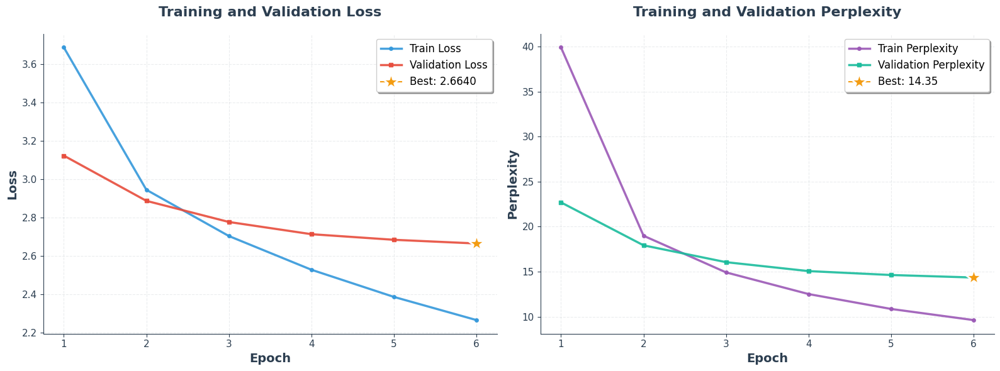


Training curves saved to: training_curves.png

2. Plotting sample predictions with images...


c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
c:\Users\xwj\.conda\envs\yolov11\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use Smoo

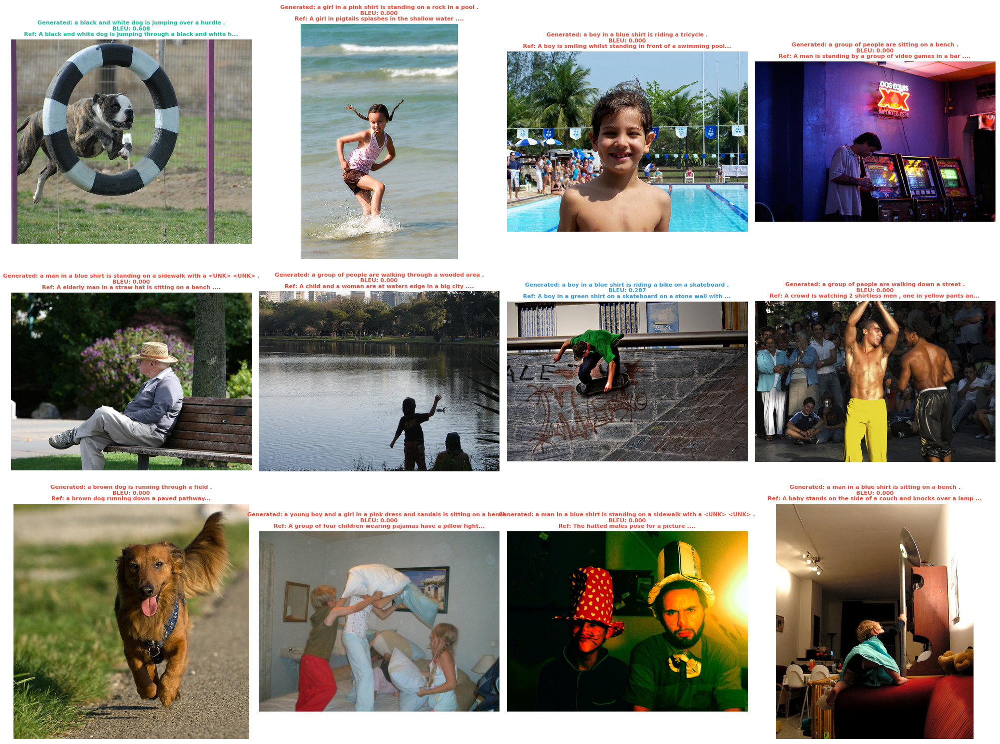

Sample predictions saved to: sample_predictions.png

3. Plotting detailed comparisons...


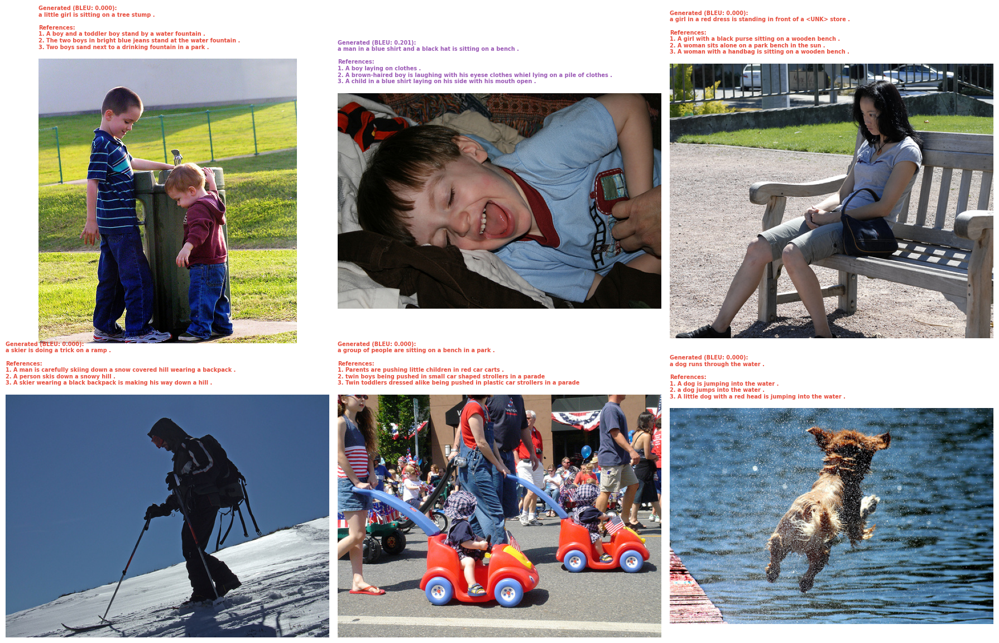

Detailed comparisons saved to: detailed_comparisons.png

4. Plotting BLEU score distribution...


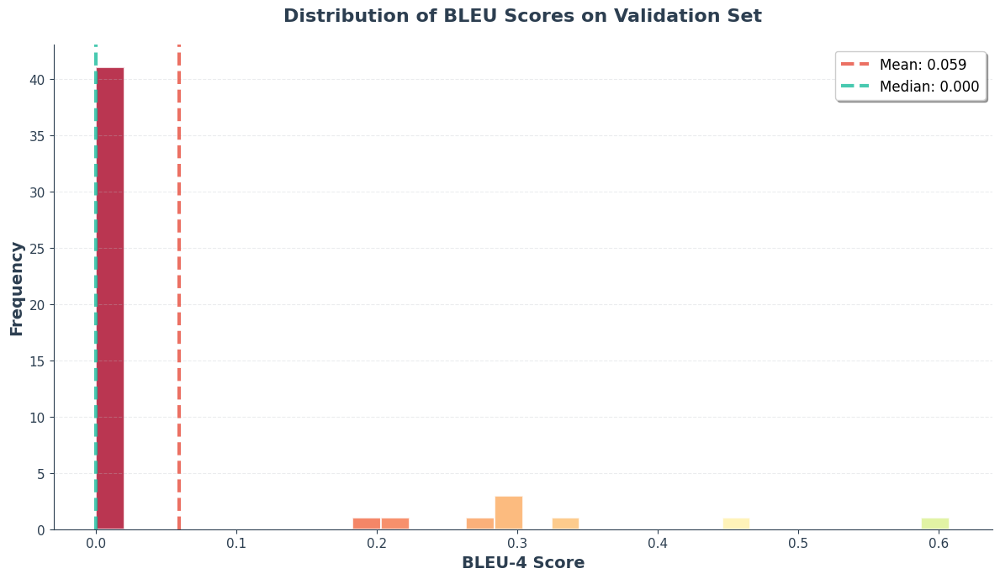

BLEU distribution saved to: bleu_distribution.png

BLEU Score Statistics:
  Mean: 0.0592
  Median: 0.0000
  Std Dev: 0.1364
  Min: 0.0000
  Max: 0.6077

SUMMARY

Model Performance:
  Best Validation Loss: 2.6640
  Perplexity: 14.3535
  BLEU-1: 0.4891
  BLEU-2: 0.2812
  BLEU-3: 0.1783
  BLEU-4: 0.1130

Dataset Statistics:
  Total images: 8091
  Total captions: 40455
  Vocabulary size: 3005
  Train images: 2750
  Val images: 486

Model Configuration:
  Embedding size: 256
  Hidden size: 512
  LSTM layers: 1
  Dropout: 0.5
  Epochs trained: 6
  Learning rate: 0.001

All visualizations completed!


In [9]:
# Cell 4: Visualization - training curves and sample predictions
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random

# Elegant color scheme (from radial mindmap)
COLORS = {
    'primary': '#e74c3c',      # Elegant red
    'blue': '#3498db',         # Fresh blue
    'purple': '#9b59b6',       # Elegant purple
    'green': '#1abc9c',        # Mint green
    'orange': '#f39c12',       # Orange
    'background': '#ecf0f1',   # Light gray-white
    'text': '#2c3e50',         # Dark blue-gray
    'grid': '#bdc3c7'          # Light gray for grid
}

# Plot training curves with elegant styling
def plot_training_history(history):
    """Plot training and validation loss curves with beautiful styling"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), facecolor='white')
    
    epochs = np.arange(1, len(history['train_loss']) + 1)
    
    # === Loss Plot ===
    ax1.plot(epochs, history['train_loss'], 
             color=COLORS['blue'], linewidth=2.5, 
             label='Train Loss', marker='o', markersize=4, 
             markevery=max(1, len(epochs)//20), alpha=0.9)
    
    ax1.plot(epochs, history['val_loss'], 
             color=COLORS['primary'], linewidth=2.5,
             label='Validation Loss', marker='s', markersize=4,
             markevery=max(1, len(epochs)//20), alpha=0.9)
    
    ax1.set_xlabel('Epoch', fontsize=14, weight='bold', color=COLORS['text'])
    ax1.set_ylabel('Loss', fontsize=14, weight='bold', color=COLORS['text'])
    ax1.set_title('Training and Validation Loss', 
                  fontsize=16, weight='bold', color=COLORS['text'], pad=20)
    
    # Styling
    ax1.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
    ax1.grid(True, alpha=0.3, linestyle='--', color=COLORS['grid'])
    ax1.set_facecolor('#ffffff')
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['left'].set_color(COLORS['text'])
    ax1.spines['bottom'].set_color(COLORS['text'])
    ax1.tick_params(colors=COLORS['text'], labelsize=11)
    
    # Add min validation loss marker
    min_val_idx = np.argmin(history['val_loss'])
    min_val_loss = history['val_loss'][min_val_idx]
    ax1.plot(min_val_idx + 1, min_val_loss, 
             marker='*', markersize=20, color=COLORS['orange'],
             markeredgecolor='white', markeredgewidth=2,
             label=f'Best: {min_val_loss:.4f}')
    ax1.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
    
    # === Perplexity Plot ===
    train_perplexity = np.array([np.exp(loss) for loss in history['train_loss']])
    val_perplexity = np.array([np.exp(loss) for loss in history['val_loss']])
    
    ax2.plot(epochs, train_perplexity, 
             color=COLORS['purple'], linewidth=2.5,
             label='Train Perplexity', marker='o', markersize=4,
             markevery=max(1, len(epochs)//20), alpha=0.9)
    
    ax2.plot(epochs, val_perplexity, 
             color=COLORS['green'], linewidth=2.5,
             label='Validation Perplexity', marker='s', markersize=4,
             markevery=max(1, len(epochs)//20), alpha=0.9)
    
    ax2.set_xlabel('Epoch', fontsize=14, weight='bold', color=COLORS['text'])
    ax2.set_ylabel('Perplexity', fontsize=14, weight='bold', color=COLORS['text'])
    ax2.set_title('Training and Validation Perplexity', 
                  fontsize=16, weight='bold', color=COLORS['text'], pad=20)
    
    # Styling
    ax2.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
    ax2.grid(True, alpha=0.3, linestyle='--', color=COLORS['grid'])
    ax2.set_facecolor('#ffffff')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['left'].set_color(COLORS['text'])
    ax2.spines['bottom'].set_color(COLORS['text'])
    ax2.tick_params(colors=COLORS['text'], labelsize=11)
    
    # Add min validation perplexity marker
    min_val_perp = val_perplexity[min_val_idx]
    ax2.plot(min_val_idx + 1, min_val_perp,
             marker='*', markersize=20, color=COLORS['orange'],
             markeredgecolor='white', markeredgewidth=2,
             label=f'Best: {min_val_perp:.2f}')
    ax2.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
    
    plt.tight_layout()
    plt.savefig('training_curves.png', dpi=300, bbox_inches='tight', 
                facecolor='white', edgecolor='none')
    plt.show()
    
    print(f"\nTraining curves saved to: training_curves.png")

# Plot sample predictions with images
def plot_predictions_with_images(num_samples=12):
    """Display images with generated and reference captions"""
    # Select random samples from generated captions
    sample_images = random.sample(list(generated_captions.keys()), min(num_samples, len(generated_captions)))
    
    rows = 3
    cols = 4
    fig = plt.figure(figsize=(20, 15), facecolor='white')
    
    for idx, img_name in enumerate(sample_images):
        if idx >= num_samples:
            break
            
        # Load image
        img_path = os.path.join(IMAGES_DIR, img_name)
        img = Image.open(img_path).convert('RGB')
        
        # Get captions
        generated = generated_captions[img_name]
        references = reference_captions[img_name]
        
        # Calculate BLEU score for this image
        gen_tokens = generated.split()
        ref_tokens = [ref.lower().split() for ref in references]
        img_bleu = sentence_bleu(ref_tokens, gen_tokens)
        
        # Plot
        ax = plt.subplot(rows, cols, idx + 1)
        plt.imshow(img)
        
        # Create title with generated caption and BLEU score
        # Color code by BLEU score
        if img_bleu > 0.4:
            title_color = COLORS['green']
        elif img_bleu > 0.2:
            title_color = COLORS['blue']
        else:
            title_color = COLORS['primary']
            
        title = f"Generated: {generated}\n"
        title += f"BLEU: {img_bleu:.3f}\n"
        title += f"Ref: {references[0][:60]}..."
        
        plt.title(title, fontsize=8, wrap=True, color=title_color, weight='bold')
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('sample_predictions.png', dpi=300, bbox_inches='tight',
                facecolor='white', edgecolor='none')
    plt.show()
    
    print(f"Sample predictions saved to: sample_predictions.png")

# Detailed comparison visualization
def plot_detailed_comparisons(num_samples=6):
    """Display detailed comparison of generated vs reference captions"""
    sample_images = random.sample(list(generated_captions.keys()), min(num_samples, len(generated_captions)))
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12), facecolor='white')
    axes = axes.flatten()
    
    for idx, img_name in enumerate(sample_images):
        if idx >= num_samples:
            break
        
        # Load image
        img_path = os.path.join(IMAGES_DIR, img_name)
        img = Image.open(img_path).convert('RGB')
        
        # Get captions
        generated = generated_captions[img_name]
        references = reference_captions[img_name]
        
        # Calculate BLEU
        gen_tokens = generated.split()
        ref_tokens = [ref.lower().split() for ref in references]
        img_bleu = sentence_bleu(ref_tokens, gen_tokens)
        
        # Plot image
        axes[idx].imshow(img)
        
        # Create detailed caption text with color coding
        caption_text = f"Generated (BLEU: {img_bleu:.3f}):\n{generated}\n\n"
        caption_text += "References:\n"
        for i, ref in enumerate(references[:3], 1):  # Show top 3 references
            caption_text += f"{i}. {ref}\n"
        
        # Color by BLEU score
        if img_bleu > 0.4:
            title_color = COLORS['green']
        elif img_bleu > 0.2:
            title_color = COLORS['purple']
        else:
            title_color = COLORS['primary']
        
        axes[idx].set_title(caption_text, fontsize=7, loc='left', 
                           wrap=True, color=title_color, weight='bold')
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.savefig('detailed_comparisons.png', dpi=300, bbox_inches='tight',
                facecolor='white', edgecolor='none')
    plt.show()
    
    print(f"Detailed comparisons saved to: detailed_comparisons.png")

# BLEU score distribution
def plot_bleu_distribution():
    """Plot distribution of BLEU scores across validation set"""
    bleu_scores = []
    
    for img_name in generated_captions.keys():
        gen_tokens = generated_captions[img_name].split()
        ref_tokens = [ref.lower().split() for ref in reference_captions[img_name]]
        bleu = sentence_bleu(ref_tokens, gen_tokens)
        bleu_scores.append(bleu)
    
    fig, ax = plt.subplots(figsize=(12, 7), facecolor='white')
    
    # Histogram with elegant styling
    n, bins, patches = ax.hist(bleu_scores, bins=30, edgecolor='white', 
                                linewidth=1.5, alpha=0.8, color=COLORS['blue'])
    
    # Color bars by value (gradient effect)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    col_map = plt.cm.RdYlGn  # Red-Yellow-Green colormap
    for c, p in zip(bin_centers, patches):
        plt.setp(p, 'facecolor', col_map(c))
    
    # Add mean and median lines
    mean_bleu = np.mean(bleu_scores)
    median_bleu = np.median(bleu_scores)
    
    ax.axvline(mean_bleu, color=COLORS['primary'], linestyle='--', 
               linewidth=3, label=f'Mean: {mean_bleu:.3f}', alpha=0.8)
    ax.axvline(median_bleu, color=COLORS['green'], linestyle='--', 
               linewidth=3, label=f'Median: {median_bleu:.3f}', alpha=0.8)
    
    ax.set_xlabel('BLEU-4 Score', fontsize=14, weight='bold', color=COLORS['text'])
    ax.set_ylabel('Frequency', fontsize=14, weight='bold', color=COLORS['text'])
    ax.set_title('Distribution of BLEU Scores on Validation Set', 
                 fontsize=16, weight='bold', color=COLORS['text'], pad=20)
    
    # Styling
    ax.legend(fontsize=12, frameon=True, shadow=True, fancybox=True)
    ax.grid(True, alpha=0.3, linestyle='--', color=COLORS['grid'], axis='y')
    ax.set_facecolor('#ffffff')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_color(COLORS['text'])
    ax.spines['bottom'].set_color(COLORS['text'])
    ax.tick_params(colors=COLORS['text'], labelsize=11)
    
    plt.tight_layout()
    plt.savefig('bleu_distribution.png', dpi=300, bbox_inches='tight',
                facecolor='white', edgecolor='none')
    plt.show()
    
    print(f"BLEU distribution saved to: bleu_distribution.png")
    print(f"\nBLEU Score Statistics:")
    print(f"  Mean: {np.mean(bleu_scores):.4f}")
    print(f"  Median: {np.median(bleu_scores):.4f}")
    print(f"  Std Dev: {np.std(bleu_scores):.4f}")
    print(f"  Min: {np.min(bleu_scores):.4f}")
    print(f"  Max: {np.max(bleu_scores):.4f}")

# Generate all visualizations
print("=" * 100)
print("Generating Visualizations")
print("=" * 100)

# 1. Training curves
print("\n1. Plotting training curves...")
plot_training_history(checkpoint['history'])

# 2. Sample predictions
print("\n2. Plotting sample predictions with images...")
plot_predictions_with_images(12)

# 3. Detailed comparisons
print("\n3. Plotting detailed comparisons...")
plot_detailed_comparisons(6)

# 4. BLEU distribution
print("\n4. Plotting BLEU score distribution...")
plot_bleu_distribution()

# Summary statistics
print("\n" + "=" * 100)
print("SUMMARY")
print("=" * 100)
print(f"\nModel Performance:")
print(f"  Best Validation Loss: {checkpoint['val_loss']:.4f}")
print(f"  Perplexity: {np.exp(checkpoint['val_loss']):.4f}")
print(f"  BLEU-1: {bleu1:.4f}")
print(f"  BLEU-2: {bleu2:.4f}")
print(f"  BLEU-3: {bleu3:.4f}")
print(f"  BLEU-4: {bleu4:.4f}")

print(f"\nDataset Statistics:")
print(f"  Total images: {len(data['image'].unique())}")
print(f"  Total captions: {len(data)}")
print(f"  Vocabulary size: {len(vocab)}")
print(f"  Train images: {len(train_images)}")
print(f"  Val images: {len(val_images)}")

print(f"\nModel Configuration:")
print(f"  Embedding size: {EMBED_SIZE}")
print(f"  Hidden size: {HIDDEN_SIZE}")
print(f"  LSTM layers: {NUM_LAYERS}")
print(f"  Dropout: {DROPOUT}")
print(f"  Epochs trained: {checkpoint['epoch']}")
print(f"  Learning rate: {LR}")

print("\n" + "=" * 100)
print("All visualizations completed!")
print("=" * 100)

In [10]:
# Cell 1: Model Structure - Terminal Printout
import torch
import torch.nn as nn
from torchvision import models
from pathlib import Path

# Load checkpoint to get vocab size
MODEL_DIR = Path('Model')
checkpoint = torch.load(MODEL_DIR / 'LSTM.pth', map_location='cpu')
vocab = checkpoint['vocab']

# Configuration
EMBED_SIZE = 256
HIDDEN_SIZE = 512
NUM_LAYERS = 1
DROPOUT = 0.5
VOCAB_SIZE = len(vocab)

print("="*100)
print("IMAGE CAPTIONING MODEL ARCHITECTURE")
print("="*100)

# ============ ENCODER ============
print("\n" + "="*100)
print("1. ENCODER (CNN): DenseNet201 - Image Feature Extraction")
print("="*100)

class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        densenet = models.densenet201(pretrained=True)
        for param in densenet.parameters():
            param.requires_grad = False
        modules = list(densenet.children())[:-1]
        self.densenet = nn.Sequential(*modules)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(1920, embed_size)
        self.bn = nn.BatchNorm1d(embed_size)
        self.dropout = nn.Dropout(0.5)
        
    def forward(self, images):
        with torch.no_grad():
            features = self.densenet(images)
        features = self.adaptive_pool(features)
        features = features.view(features.size(0), -1)
        features = self.fc(features)
        features = self.bn(features)
        features = self.dropout(features)
        return features

encoder = EncoderCNN(EMBED_SIZE)
print(f"\n  Input:  RGB Image [batch, 3, 224, 224]")
print(f"  │")
print(f"  ├─→ DenseNet201 (pretrained, frozen) [batch, 1920, 7, 7]")
print(f"  │")
print(f"  ├─→ AdaptiveAvgPool2d [batch, 1920, 1, 1]")
print(f"  │")
print(f"  ├─→ Flatten [batch, 1920]")
print(f"  │")
print(f"  ├─→ Linear(1920 → {EMBED_SIZE}) [batch, {EMBED_SIZE}]")
print(f"  │")
print(f"  ├─→ BatchNorm1d({EMBED_SIZE})")
print(f"  │")
print(f"  └─→ Dropout(p={DROPOUT})")
print(f"\n  Output: Image Features [batch, {EMBED_SIZE}]")

total_params = sum(p.numel() for p in encoder.parameters())
trainable_params = sum(p.numel() for p in encoder.parameters() if p.requires_grad)
print(f"\n  Total Parameters: {total_params:,}")
print(f"  Trainable Parameters: {trainable_params:,}")
print(f"  Frozen Parameters: {total_params - trainable_params:,}")

# ============ DECODER ============
print("\n" + "="*100)
print("2. DECODER (LSTM): Caption Generation")
print("="*100)

class DecoderLSTM(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1, dropout=0.5):
        super(DecoderLSTM, self).__init__()
        self.embed_size = embed_size
        self.hidden_size = hidden_size
        self.vocab_size = vocab_size
        self.num_layers = num_layers
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, 
                           batch_first=True, dropout=dropout if num_layers > 1 else 0)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_size, vocab_size)
        
    def forward(self, features, captions, lengths):
        embeddings = self.embedding(captions)
        features = features.unsqueeze(1)
        embeddings = torch.cat([features, embeddings[:, :-1, :]], dim=1)
        packed = nn.utils.rnn.pack_padded_sequence(embeddings, lengths, batch_first=True, enforce_sorted=True)
        hiddens, _ = self.lstm(packed)
        hiddens, _ = nn.utils.rnn.pad_packed_sequence(hiddens, batch_first=True)
        outputs = self.fc(self.dropout(hiddens))
        return outputs

decoder = DecoderLSTM(EMBED_SIZE, HIDDEN_SIZE, VOCAB_SIZE, NUM_LAYERS, DROPOUT)

print(f"\n  A. WORD EMBEDDING LAYER")
print(f"  ─────────────────────────")
print(f"  Input:  Word Indices [batch, seq_len]")
print(f"  │")
print(f"  └─→ Embedding({VOCAB_SIZE} words → {EMBED_SIZE} dims)")
print(f"\n  Output: Word Embeddings [batch, seq_len, {EMBED_SIZE}]")
print(f"\n  Embedding Matrix Shape: [{VOCAB_SIZE}, {EMBED_SIZE}]")
print(f"  Total Embedding Parameters: {VOCAB_SIZE * EMBED_SIZE:,}")

print(f"\n\n  B. FEATURE FUSION")
print(f"  ─────────────────")
print(f"  Image Features [batch, {EMBED_SIZE}] → unsqueeze → [batch, 1, {EMBED_SIZE}]")
print(f"  │")
print(f"  ├─→ Concatenate with Word Embeddings")
print(f"  │")
print(f"  └─→ Combined: [batch, seq_len, {EMBED_SIZE}]")

print(f"\n\n  C. LSTM SEQUENCE MODELING")
print(f"  ──────────────────────────")
print(f"  Input:  Combined Features [batch, seq_len, {EMBED_SIZE}]")
print(f"  │")
print(f"  ├─→ Pack Padded Sequence (variable lengths)")
print(f"  │")
print(f"  ├─→ LSTM({EMBED_SIZE} → {HIDDEN_SIZE}, layers={NUM_LAYERS})")
print(f"  │   • Hidden State: [batch, seq_len, {HIDDEN_SIZE}]")
print(f"  │   • Captures sequential dependencies")
print(f"  │")
print(f"  └─→ Unpack Sequence")
print(f"\n  Output: Hidden States [batch, seq_len, {HIDDEN_SIZE}]")

print(f"\n\n  D. OUTPUT PROJECTION")
print(f"  ────────────────────")
print(f"  Input:  Hidden States [batch, seq_len, {HIDDEN_SIZE}]")
print(f"  │")
print(f"  ├─→ Dropout(p={DROPOUT})")
print(f"  │")
print(f"  └─→ Linear({HIDDEN_SIZE} → {VOCAB_SIZE})")
print(f"\n  Output: Word Probabilities [batch, seq_len, {VOCAB_SIZE}]")

total_params = sum(p.numel() for p in decoder.parameters())
trainable_params = sum(p.numel() for p in decoder.parameters() if p.requires_grad)
print(f"\n  Total Parameters: {total_params:,}")
print(f"  Trainable Parameters: {trainable_params:,}")

# ============ VOCABULARY ============
print("\n" + "="*100)
print("3. VOCABULARY")
print("="*100)
print(f"\n  Total Words: {VOCAB_SIZE:,}")
print(f"  Special Tokens:")
print(f"    • <PAD> (id: {vocab.word2idx['<PAD>']}) - Padding token")
print(f"    • <START> (id: {vocab.word2idx['<START>']}) - Start of caption")
print(f"    • <END> (id: {vocab.word2idx['<END>']}) - End of caption")
print(f"    • <UNK> (id: {vocab.word2idx['<UNK>']}) - Unknown word")
print(f"  Regular Words: {VOCAB_SIZE - 4:,}")

# Sample words
print(f"\n  Sample Words from Vocabulary:")
sample_words = list(vocab.word2idx.keys())[4:24]
for i, word in enumerate(sample_words, 1):
    if i % 5 == 1:
        print(f"    ", end="")
    print(f"{word:12s}", end="")
    if i % 5 == 0:
        print()

# ============ WORKFLOW ============
print("\n" + "="*100)
print("4. TRAINING WORKFLOW")
print("="*100)

print("""
  STEP 1: DATA PREPROCESSING
  ──────────────────────────
  Image (RGB) ────→ Resize(224×224) ────→ Normalize ────→ Tensor [3, 224, 224]
  Caption (text) ─→ Tokenize ───→ <START> + words + <END> ─→ Indices [seq_len]

  STEP 2: FORWARD PASS
  ────────────────────
  Image [batch, 3, 224, 224]
    │
    └─→ ENCODER ────→ Features [batch, 256]
                          │
  Caption Indices          │
  [batch, seq_len]         │
    │                      │
    └─→ Embedding ─────────┴─→ DECODER ────→ Predictions [batch, seq_len, vocab_size]

  STEP 3: LOSS CALCULATION
  ────────────────────────
  Predictions [batch, seq_len, vocab_size]
  Ground Truth [batch, seq_len]
    │
    └─→ CrossEntropyLoss (ignore <PAD>) ────→ Loss (scalar)

  STEP 4: BACKPROPAGATION
  ───────────────────────
  Loss ────→ loss.backward() ────→ Gradients
    │
    └─→ Gradient Clipping (max_norm=5.0)
    │
    └─→ Optimizer.step() ────→ Update Weights

  STEP 5: INFERENCE (Caption Generation)
  ──────────────────────────────────────
  Image ────→ ENCODER ────→ Features [1, 256]
    │
    ├─→ Start with <START> token
    │
    └─→ Loop (max 20 steps):
         │
         ├─→ Embed current word
         ├─→ LSTM forward
         ├─→ Predict next word (argmax)
         ├─→ Stop if <END> predicted
         └─→ Use predicted word as next input
""")

# ============ SUMMARY ============
print("\n" + "="*100)
print("5. MODEL SUMMARY")
print("="*100)

encoder_total = sum(p.numel() for p in encoder.parameters())
encoder_trainable = sum(p.numel() for p in encoder.parameters() if p.requires_grad)
decoder_total = sum(p.numel() for p in decoder.parameters())
total_all = encoder_total + decoder_total
trainable_all = encoder_trainable + decoder_total

print(f"\n  Component                    Total Params    Trainable Params")
print(f"  ─────────────────────────────────────────────────────────────")
print(f"  Encoder (DenseNet201)        {encoder_total:>12,}    {encoder_trainable:>16,}")
print(f"  Decoder (LSTM)               {decoder_total:>12,}    {decoder_total:>16,}")
print(f"  ─────────────────────────────────────────────────────────────")
print(f"  TOTAL                        {total_all:>12,}    {trainable_all:>16,}")

print(f"\n  Vocabulary Size:             {VOCAB_SIZE:,}")
print(f"  Embedding Dimension:         {EMBED_SIZE}")
print(f"  LSTM Hidden Size:            {HIDDEN_SIZE}")
print(f"  LSTM Layers:                 {NUM_LAYERS}")
print(f"  Dropout Rate:                {DROPOUT}")

print("\n" + "="*100)
print("END OF MODEL STRUCTURE")
print("="*100 + "\n")

C:\Users\xwj\AppData\Local\Temp\ipykernel_38456\1594037093.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(MODEL_DIR / 'LSTM.pth', map_location='

IMAGE CAPTIONING MODEL ARCHITECTURE

1. ENCODER (CNN): DenseNet201 - Image Feature Extraction

  Input:  RGB Image [batch, 3, 224, 224]
  │
  ├─→ DenseNet201 (pretrained, frozen) [batch, 1920, 7, 7]
  │
  ├─→ AdaptiveAvgPool2d [batch, 1920, 1, 1]
  │
  ├─→ Flatten [batch, 1920]
  │
  ├─→ Linear(1920 → 256) [batch, 256]
  │
  ├─→ BatchNorm1d(256)
  │
  └─→ Dropout(p=0.5)

  Output: Image Features [batch, 256]

  Total Parameters: 18,585,216
  Trainable Parameters: 492,288
  Frozen Parameters: 18,092,928

2. DECODER (LSTM): Caption Generation

  A. WORD EMBEDDING LAYER
  ─────────────────────────
  Input:  Word Indices [batch, seq_len]
  │
  └─→ Embedding(3005 words → 256 dims)

  Output: Word Embeddings [batch, seq_len, 256]

  Embedding Matrix Shape: [3005, 256]
  Total Embedding Parameters: 769,280


  B. FEATURE FUSION
  ─────────────────
  Image Features [batch, 256] → unsqueeze → [batch, 1, 256]
  │
  ├─→ Concatenate with Word Embeddings
  │
  └─→ Combined: [batch, seq_len, 256]




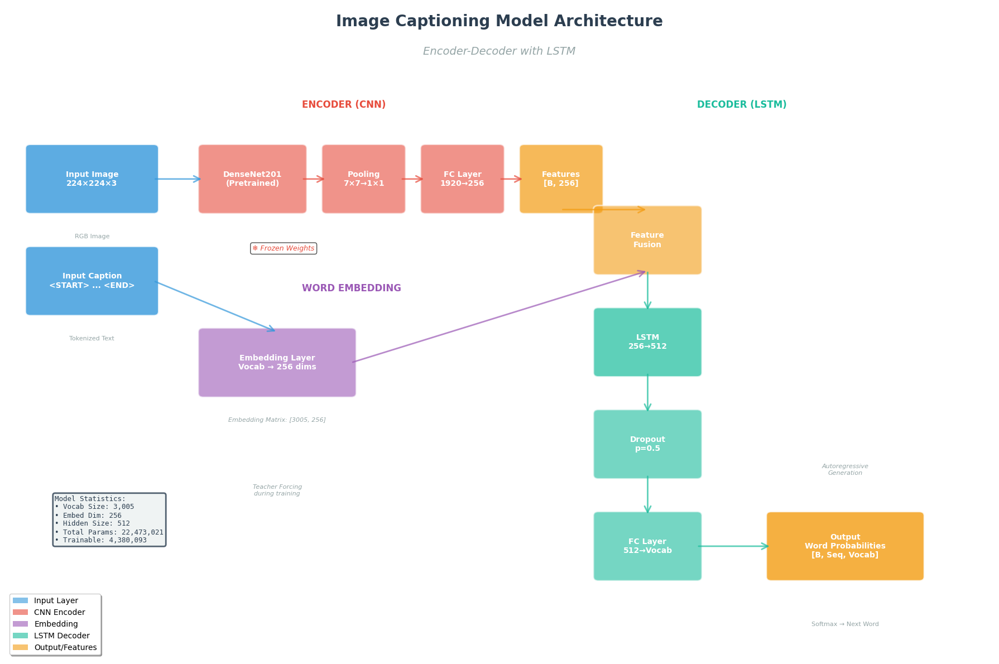


✓ Model architecture diagram saved to: model_architecture.png


In [11]:
# Cell 2: Model Structure - Visual Diagram
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch, FancyArrowPatch, Circle
import numpy as np

# Elegant color scheme (consistent with training curves)
COLORS = {
    'primary': '#e74c3c',      # Elegant red
    'blue': '#3498db',         # Fresh blue
    'purple': '#9b59b6',       # Elegant purple
    'green': '#1abc9c',        # Mint green
    'orange': '#f39c12',       # Orange
    'background': '#ecf0f1',   # Light gray-white
    'text': '#2c3e50',         # Dark blue-gray
    'gray': '#95a5a6'          # Medium gray
}

# Create figure
fig, ax = plt.subplots(figsize=(18, 12), facecolor='white')
ax.set_xlim(0, 20)
ax.set_ylim(0, 16)
ax.axis('off')

# Title
ax.text(10, 15.5, 'Image Captioning Model Architecture', 
        fontsize=20, weight='bold', ha='center', color=COLORS['text'])
ax.text(10, 14.8, 'Encoder-Decoder with LSTM', 
        fontsize=14, ha='center', color=COLORS['gray'], style='italic')

# Helper function for boxes
def draw_box(x, y, w, h, text, color, alpha=0.3, textcolor='white'):
    box = FancyBboxPatch((x, y), w, h, boxstyle="round,pad=0.1",
                         facecolor=color, edgecolor='white', 
                         linewidth=2, alpha=alpha)
    ax.add_patch(box)
    ax.text(x + w/2, y + h/2, text, ha='center', va='center',
           fontsize=10, weight='bold', color=textcolor)

def draw_arrow(x1, y1, x2, y2, color=COLORS['text'], style='->', lw=2):
    arrow = FancyArrowPatch((x1, y1), (x2, y2),
                           arrowstyle=style, color=color, 
                           linewidth=lw, alpha=0.7,
                           mutation_scale=20)
    ax.add_patch(arrow)

# ========== INPUT ==========
# Image Input
draw_box(0.5, 11, 2.5, 1.5, 'Input Image\n224×224×3', COLORS['blue'], alpha=0.8)
ax.text(1.75, 10.3, 'RGB Image', ha='center', fontsize=8, color=COLORS['gray'])

# Caption Input
draw_box(0.5, 8.5, 2.5, 1.5, 'Input Caption\n<START> ... <END>', COLORS['blue'], alpha=0.8)
ax.text(1.75, 7.8, 'Tokenized Text', ha='center', fontsize=8, color=COLORS['gray'])

# ========== ENCODER ==========
ax.text(6, 13.5, 'ENCODER (CNN)', fontsize=12, weight='bold', color=COLORS['primary'])

draw_box(4, 11, 2, 1.5, 'DenseNet201\n(Pretrained)', COLORS['primary'], alpha=0.6)
draw_arrow(3, 11.75, 4, 11.75, COLORS['blue'])

draw_box(6.5, 11, 1.5, 1.5, 'Pooling\n7×7→1×1', COLORS['primary'], alpha=0.6)
draw_arrow(6, 11.75, 6.5, 11.75, COLORS['primary'])

draw_box(8.5, 11, 1.5, 1.5, 'FC Layer\n1920→256', COLORS['primary'], alpha=0.6)
draw_arrow(8, 11.75, 8.5, 11.75, COLORS['primary'])

draw_box(10.5, 11, 1.5, 1.5, 'Features\n[B, 256]', COLORS['orange'], alpha=0.7)
draw_arrow(10, 11.75, 10.5, 11.75, COLORS['primary'])

# ========== EMBEDDING ==========
ax.text(6, 9, 'WORD EMBEDDING', fontsize=12, weight='bold', color=COLORS['purple'])

draw_box(4, 6.5, 3, 1.5, 'Embedding Layer\nVocab → 256 dims', COLORS['purple'], alpha=0.6)
draw_arrow(3, 9.25, 5.5, 8, COLORS['blue'])

ax.text(5.5, 5.8, f'Embedding Matrix: [{VOCAB_SIZE}, 256]', 
        ha='center', fontsize=8, color=COLORS['gray'], style='italic')

# ========== DECODER ==========
ax.text(14, 13.5, 'DECODER (LSTM)', fontsize=12, weight='bold', color=COLORS['green'])

# Fusion
draw_box(12, 9.5, 2, 1.5, 'Feature\nFusion', COLORS['orange'], alpha=0.6)
draw_arrow(11.25, 11, 13, 11, COLORS['orange'])
draw_arrow(7, 7.25, 13, 9.5, COLORS['purple'])

# LSTM
draw_box(12, 7, 2, 1.5, 'LSTM\n256→512', COLORS['green'], alpha=0.7)
draw_arrow(13, 9.5, 13, 8.5, COLORS['green'])

# Dropout
draw_box(12, 4.5, 2, 1.5, 'Dropout\np=0.5', COLORS['green'], alpha=0.6)
draw_arrow(13, 7, 13, 6, COLORS['green'])

# Output Layer
draw_box(12, 2, 2, 1.5, 'FC Layer\n512→Vocab', COLORS['green'], alpha=0.6)
draw_arrow(13, 4.5, 13, 3.5, COLORS['green'])

# ========== OUTPUT ==========
draw_box(15.5, 2, 3, 1.5, 'Output\nWord Probabilities\n[B, Seq, Vocab]', 
         COLORS['orange'], alpha=0.8)
draw_arrow(14, 2.75, 15.5, 2.75, COLORS['green'])

ax.text(17, 0.8, 'Softmax → Next Word', ha='center', fontsize=8, color=COLORS['gray'])

# ========== LEGEND ==========
legend_elements = [
    mpatches.Patch(facecolor=COLORS['blue'], alpha=0.6, label='Input Layer'),
    mpatches.Patch(facecolor=COLORS['primary'], alpha=0.6, label='CNN Encoder'),
    mpatches.Patch(facecolor=COLORS['purple'], alpha=0.6, label='Embedding'),
    mpatches.Patch(facecolor=COLORS['green'], alpha=0.6, label='LSTM Decoder'),
    mpatches.Patch(facecolor=COLORS['orange'], alpha=0.6, label='Output/Features'),
]
ax.legend(handles=legend_elements, loc='lower left', fontsize=10, 
         frameon=True, shadow=True, fancybox=True)

# ========== ANNOTATIONS ==========
# Frozen weights note
ax.text(5, 10, '❄ Frozen Weights', fontsize=9, color=COLORS['primary'], 
        style='italic', bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

# Teacher forcing note
ax.text(5.5, 4, 'Teacher Forcing\nduring training', fontsize=8, 
        color=COLORS['gray'], ha='center', style='italic')

# Autoregressive note
ax.text(17, 4.5, 'Autoregressive\nGeneration', fontsize=8, 
        color=COLORS['gray'], ha='center', style='italic')

# Stats box
stats_text = f"""Model Statistics:
• Vocab Size: {VOCAB_SIZE:,}
• Embed Dim: 256
• Hidden Size: 512
• Total Params: {total_all:,}
• Trainable: {trainable_all:,}"""

ax.text(1, 4, stats_text, fontsize=9, color=COLORS['text'],
        bbox=dict(boxstyle='round', facecolor=COLORS['background'], 
                 edgecolor=COLORS['text'], linewidth=2, alpha=0.8),
        verticalalignment='top', family='monospace')

plt.tight_layout()
plt.savefig('model_architecture.png', dpi=300, bbox_inches='tight', 
            facecolor='white', edgecolor='none')
plt.show()

print("\n✓ Model architecture diagram saved to: model_architecture.png")